In [1]:
!pip install seqeval==1.0.0

You should consider upgrading via the '/usr/bin/python3 -m pip install --upgrade pip' command.


In [2]:
import os, random
import tensorflow as tf
import tensorflow.keras as ks
import numpy as np
from tensorflow.keras.applications import InceptionResNetV2
from tensorflow.keras.preprocessing import image_dataset_from_directory
from tensorflow.keras import layers
import matplotlib.pyplot as plt
from seqeval.metrics import classification_report
import time

In [3]:
config = {
    "dataset_path": "images/",
    "validation_ratio": 0.2,
    "image_size": (300, 300),
    "input_shape": (300, 300, 3),
    "batch_size": 32,
    "mode": "test",
    "saved_model_path": "save/brute-force/model",
    "num_showing_pictures": 30,
}

# train/test 데이터셋 나누기

In [4]:
from prep_image.loader import image_loader

# 모델 불러오기

In [5]:
def load_saved_model(config):
    model = ks.models.load_model(config['saved_model_path'])
    model.compile()
    return model

# 학습과 테스트 정의하기

In [6]:
def main(config):
    model = load_saved_model(config)
    print('system >> model summary')
    model.summary()
    
    do_test(model, config)
    
def do_test(model, config):
    shape = (config['batch_size'], *config['image_size'], 3)
    valid_ds = image_loader(config['dataset_path'], config['validation_ratio'], 
                                  config['image_size'], config['batch_size'], subset='valid')
    class_names = valid_ds.class_names
    print('system >> identified classes:', *class_names)
    
    print('system >> showing images...')
    for idx, (images, labels) in enumerate(valid_ds.take(15)):
        plt.figure(figsize=(15, 15))
        for i in range(9):
            ax = plt.subplot(3, 3, i + 1)
            predicts = model.predict(images)
            plt.imshow(images[i].numpy().astype("uint8"))
            plt.title(class_names[np.argmax(labels[i])] + " vs. " + class_names[np.argmax(predicts[i])])
            plt.axis("off")
        plt.show()
        plt.savefig('{}.png'.format(idx))
            
    print('system >> test begins...')
    print(predicts)

system >> model summary
Model: "sequential_15"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
rescaling_4 (Rescaling)      (None, 300, 300, 3)       0         
_________________________________________________________________
sequential_13 (Sequential)   (None, 37, 37, 256)       690144    
_________________________________________________________________
sequential_14 (Sequential)   (None, 3)                 70093603  
Total params: 70,783,747
Trainable params: 70,783,747
Non-trainable params: 0
_________________________________________________________________
Found 45000 files belonging to 3 classes.
Using 9000 files for validation.
system >> identified classes: 0food 1interior 2exterior
system >> showing images...


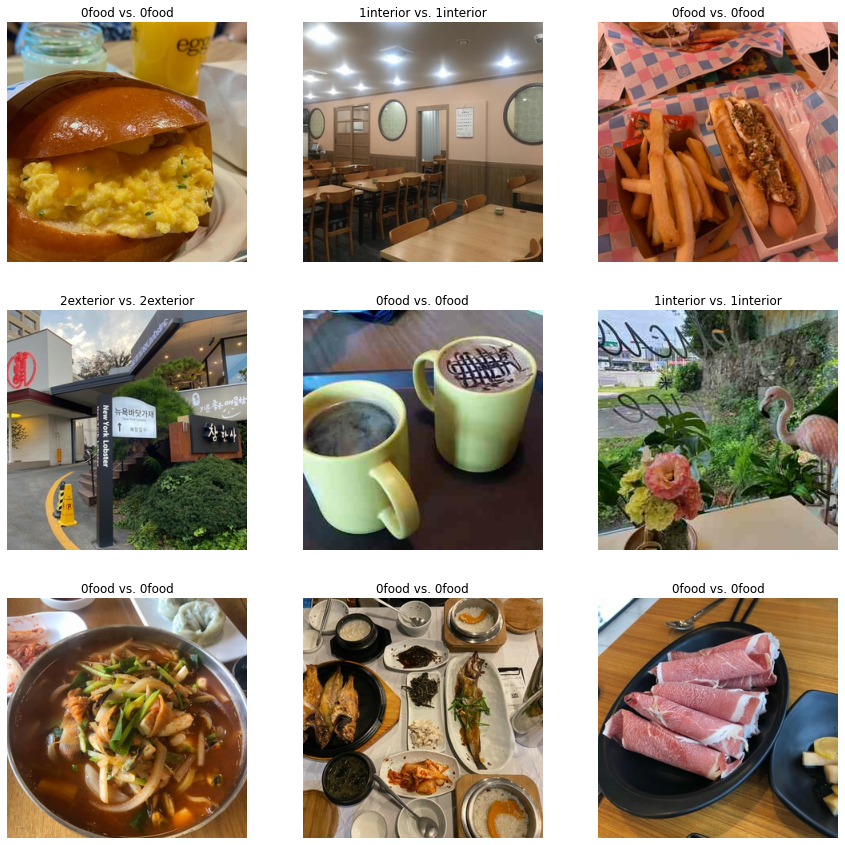

<Figure size 432x288 with 0 Axes>

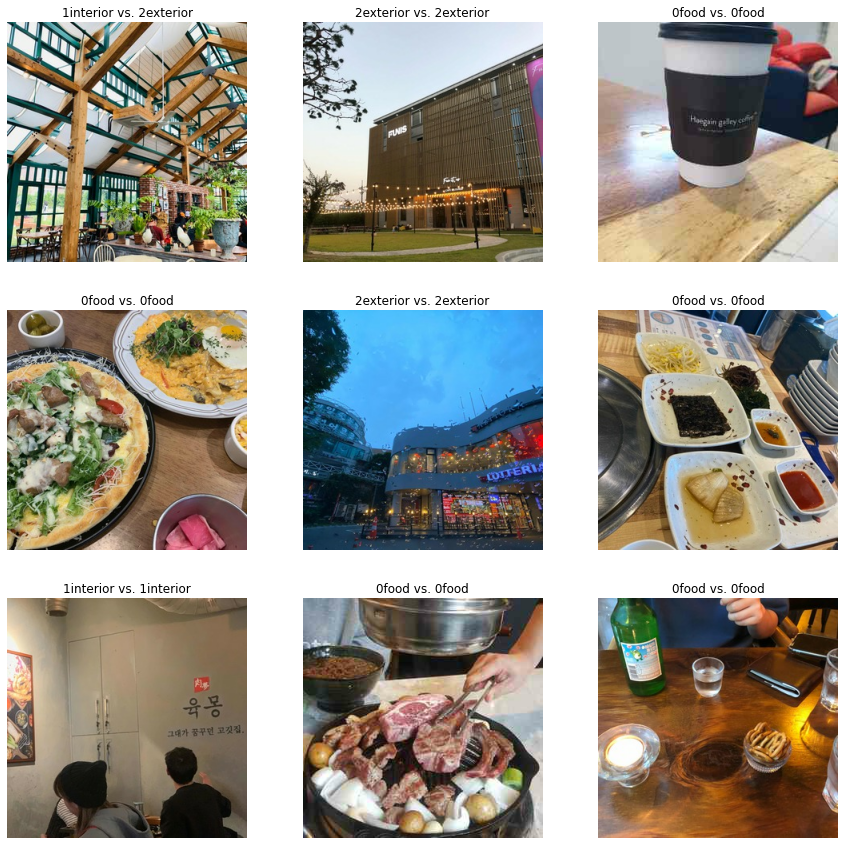

<Figure size 432x288 with 0 Axes>

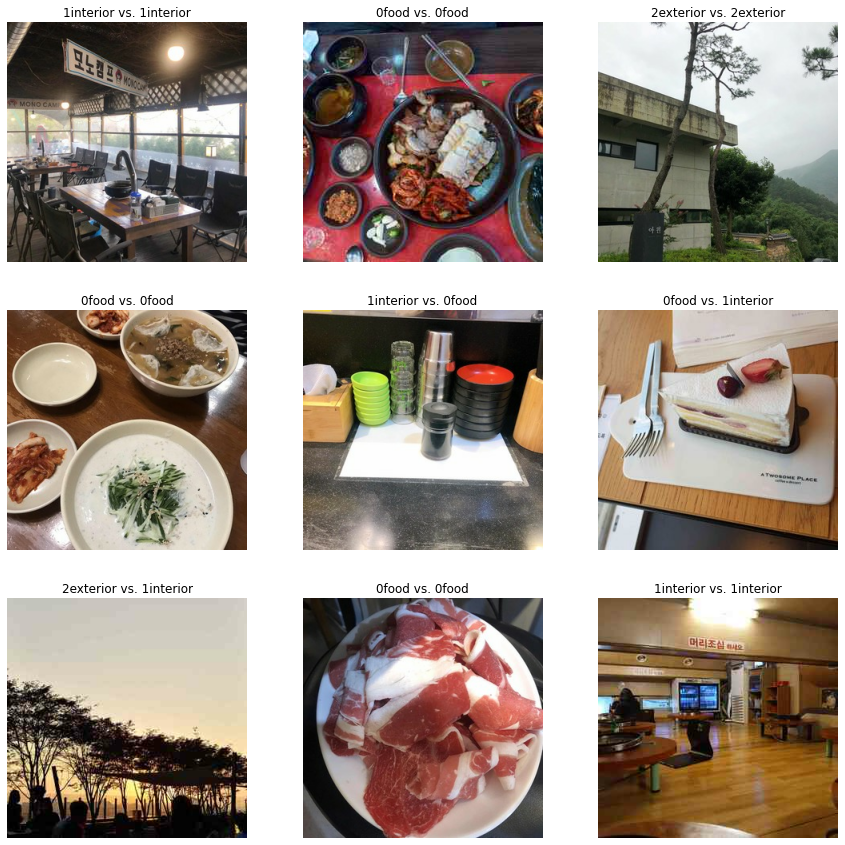

<Figure size 432x288 with 0 Axes>

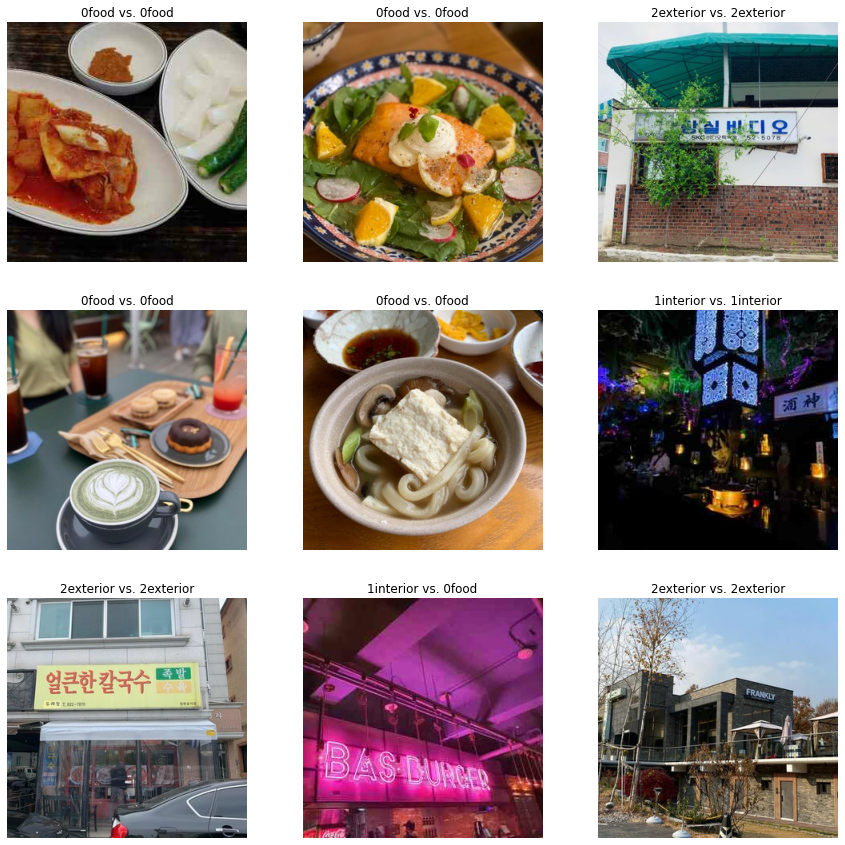

<Figure size 432x288 with 0 Axes>

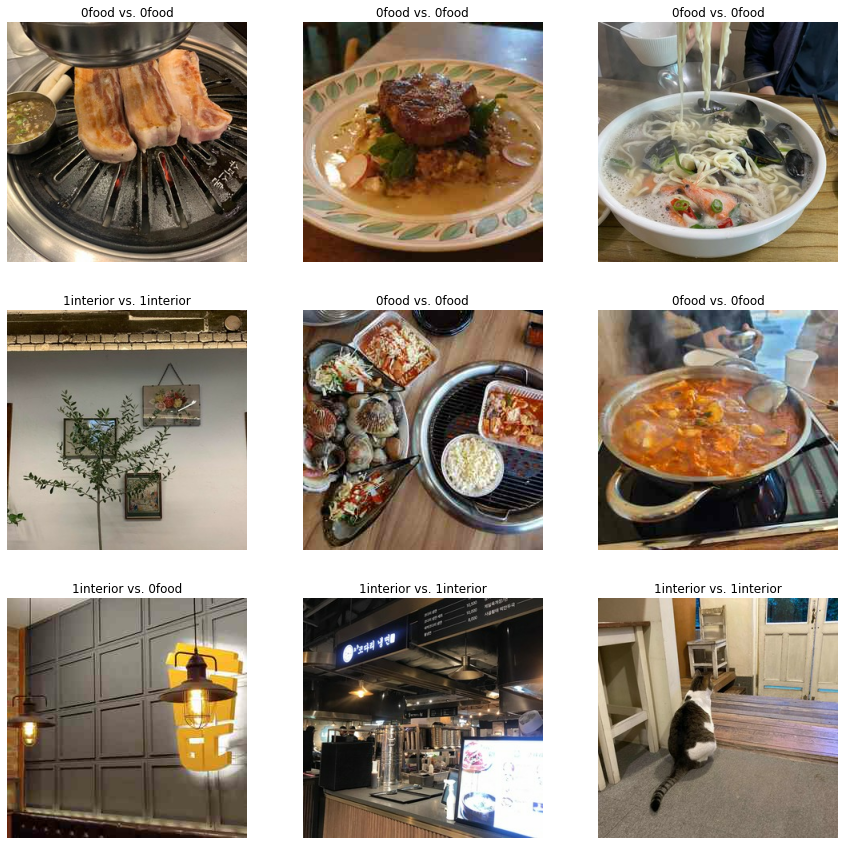

<Figure size 432x288 with 0 Axes>

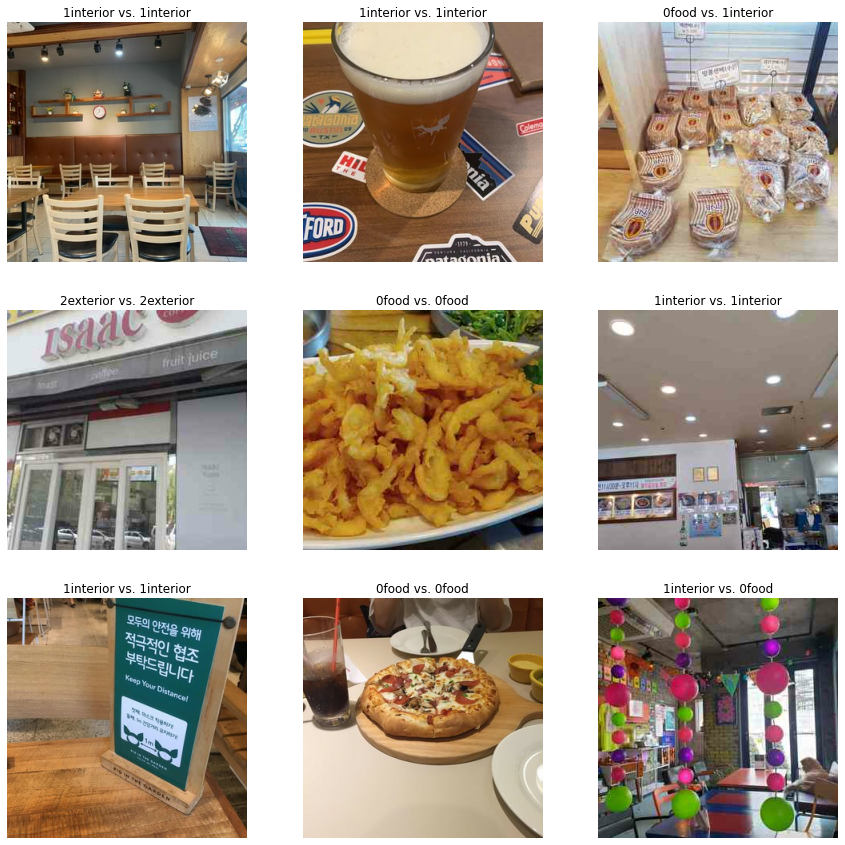

<Figure size 432x288 with 0 Axes>

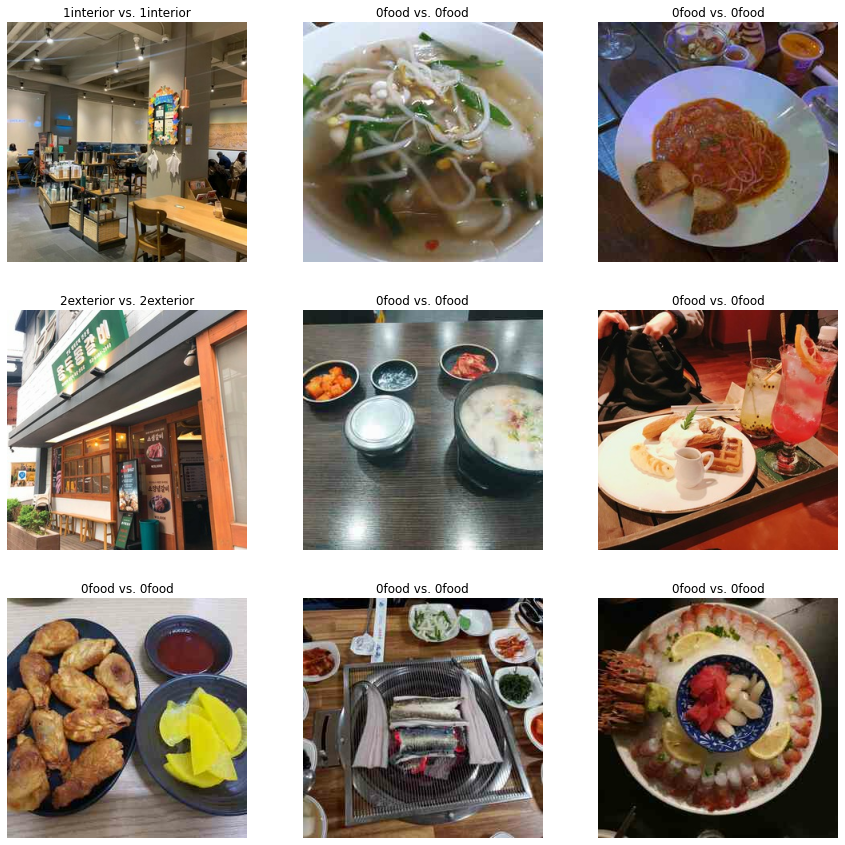

<Figure size 432x288 with 0 Axes>

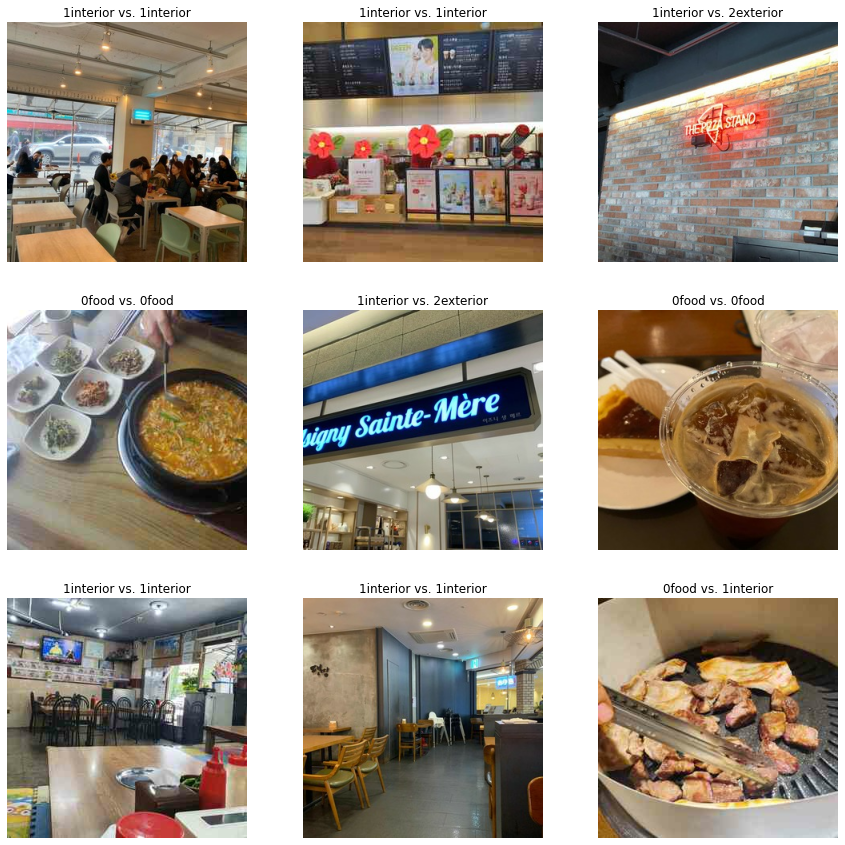

<Figure size 432x288 with 0 Axes>

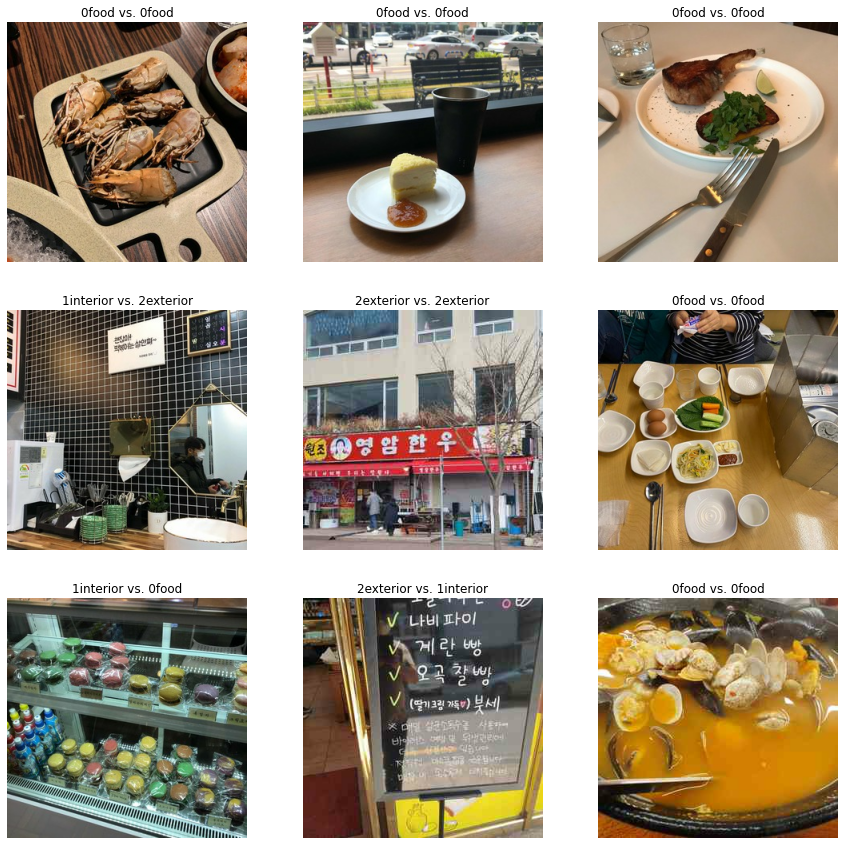

<Figure size 432x288 with 0 Axes>

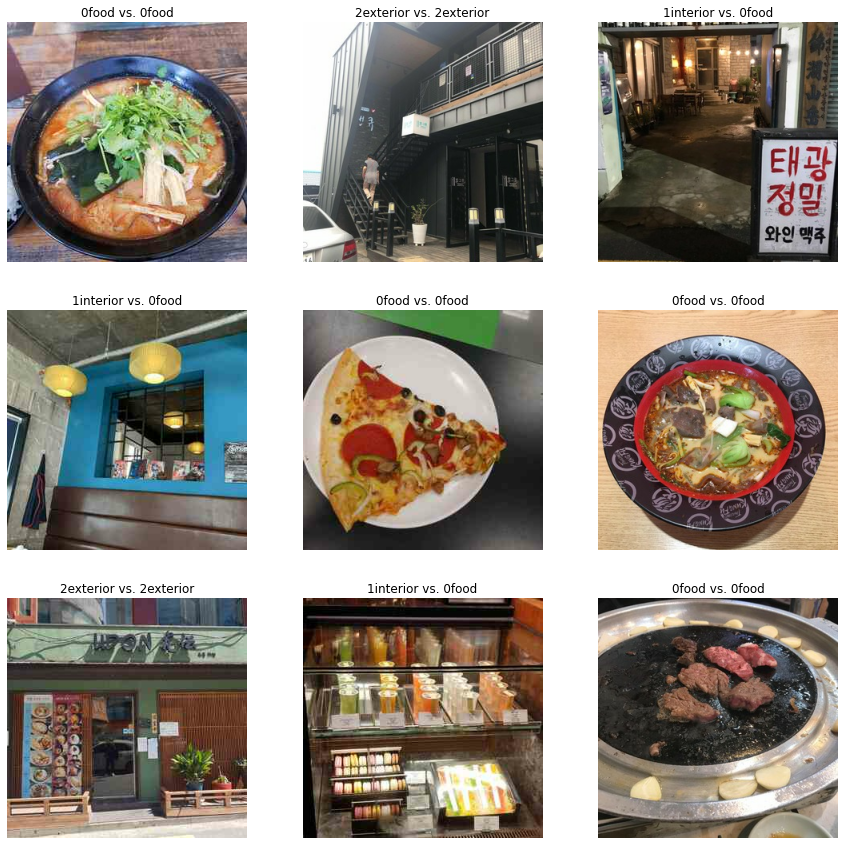

<Figure size 432x288 with 0 Axes>

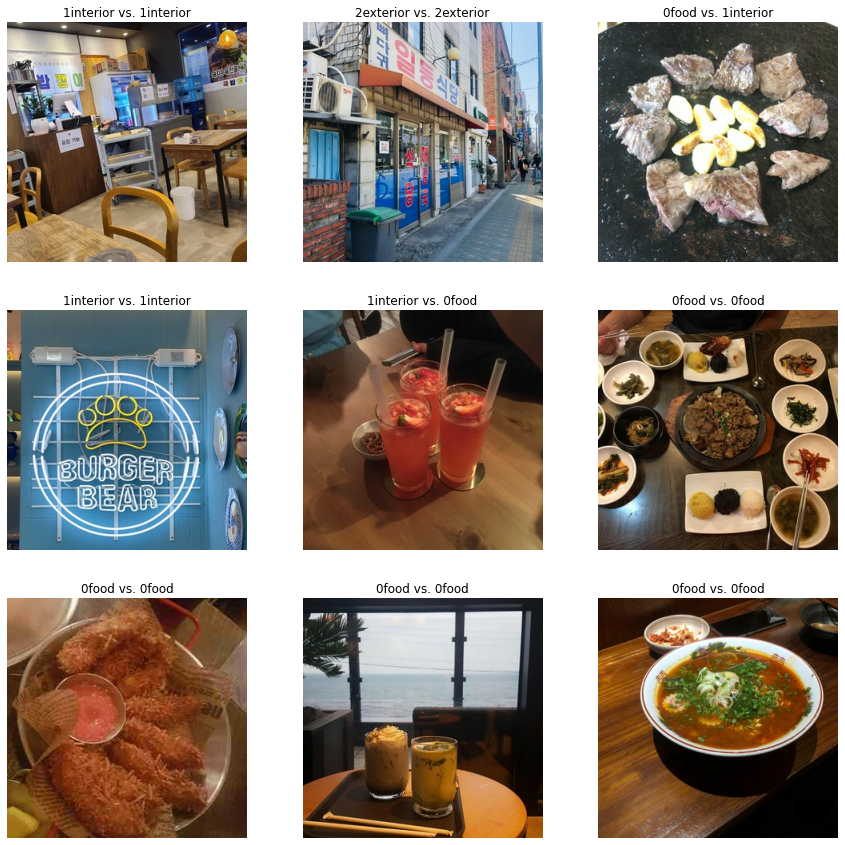

<Figure size 432x288 with 0 Axes>

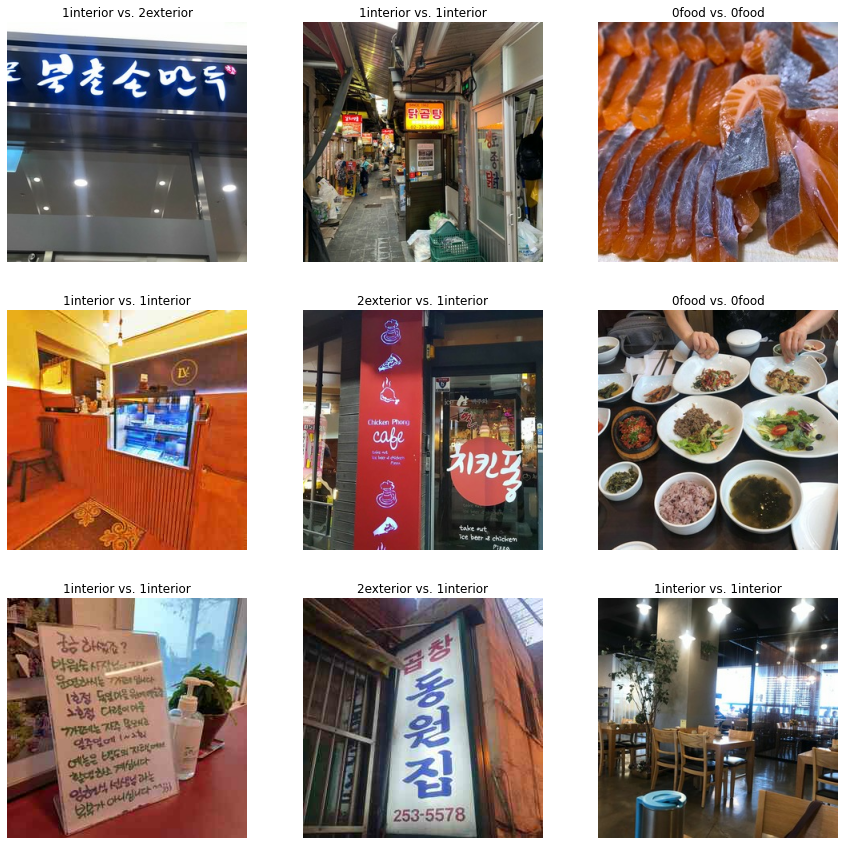

<Figure size 432x288 with 0 Axes>

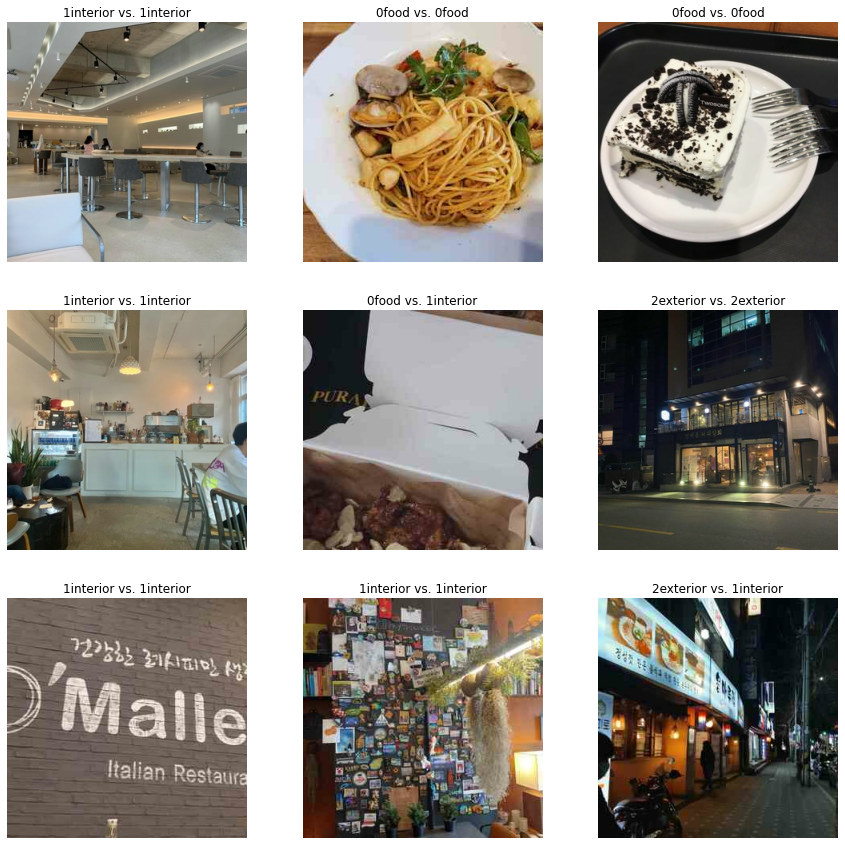

<Figure size 432x288 with 0 Axes>

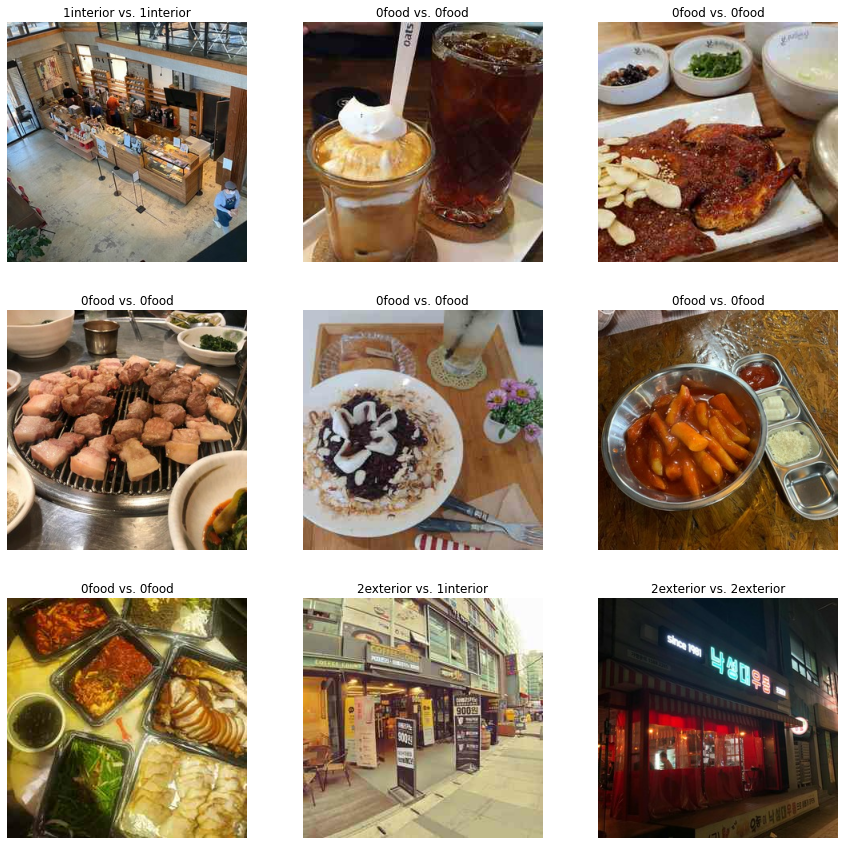

<Figure size 432x288 with 0 Axes>

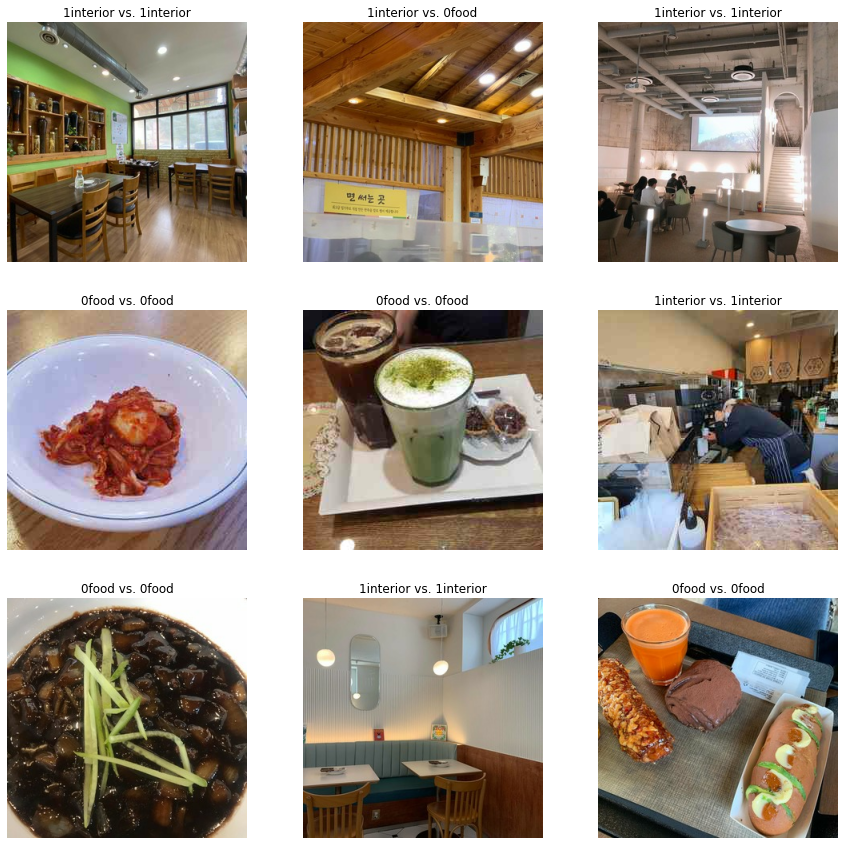

system >> test begins...
[[2.2207424e-03 9.8689646e-01 1.0882838e-02]
 [5.6725788e-01 3.4424594e-01 8.8496178e-02]
 [1.4975016e-01 7.4784851e-01 1.0240129e-01]
 [9.9542445e-01 4.4414788e-03 1.3411669e-04]
 [9.8228502e-01 1.5784837e-02 1.9301726e-03]
 [9.9046091e-03 9.7170073e-01 1.8394569e-02]
 [5.7381099e-01 2.8420222e-01 1.4198679e-01]
 [5.3351615e-02 9.0125400e-01 4.5394447e-02]
 [9.7335488e-01 1.8193148e-02 8.4519861e-03]
 [1.0448181e-02 9.3747765e-01 5.2074183e-02]
 [7.8213799e-01 1.3235210e-01 8.5509971e-02]
 [1.7126305e-01 7.8829974e-01 4.0437188e-02]
 [3.5497572e-02 1.5004119e-01 8.1446123e-01]
 [8.3556777e-01 1.4043593e-01 2.3996348e-02]
 [1.4860573e-03 3.7181540e-03 9.9479586e-01]
 [6.6462737e-01 1.4908980e-01 1.8628281e-01]
 [8.9067913e-04 9.9554282e-01 3.5665222e-03]
 [8.8353217e-01 5.0436296e-02 6.6031605e-02]
 [9.9173295e-01 8.1231510e-03 1.4388116e-04]
 [6.9986802e-01 2.7974397e-01 2.0388046e-02]
 [9.9983001e-01 1.6305571e-04 6.9635917e-06]
 [1.4073942e-02 3.4612123e-02 

<Figure size 432x288 with 0 Axes>

In [7]:
main(config)